In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image_dataset_from_directory

c:\Users\dangw\anaconda3\envs\cifer\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
data = tf.keras.utils.image_dataset_from_directory('Train 1', image_size=(224, 224))

Found 639639 files belonging to 1000 classes.


In [4]:
test = tf.keras.utils.image_dataset_from_directory('Test', image_size=(224, 224))

Found 50000 files belonging to 1000 classes.


In [5]:
data_iterator = data.as_numpy_iterator()
test_iterator = test.as_numpy_iterator()

In [6]:
test_iterator

In [7]:
train_batch = data_iterator.next()
test_batch = test_iterator.next()

In [8]:
train_batch[0].shape

(32, 224, 224, 3)

In [9]:
train_batch[1]

array([233, 865, 871,   7, 244, 278, 220, 690, 946, 266, 995,  67, 913,
       230, 184, 758, 852, 501, 615, 326, 316, 138, 449, 226, 661, 260,
       463, 739, 505,  45, 780, 450])

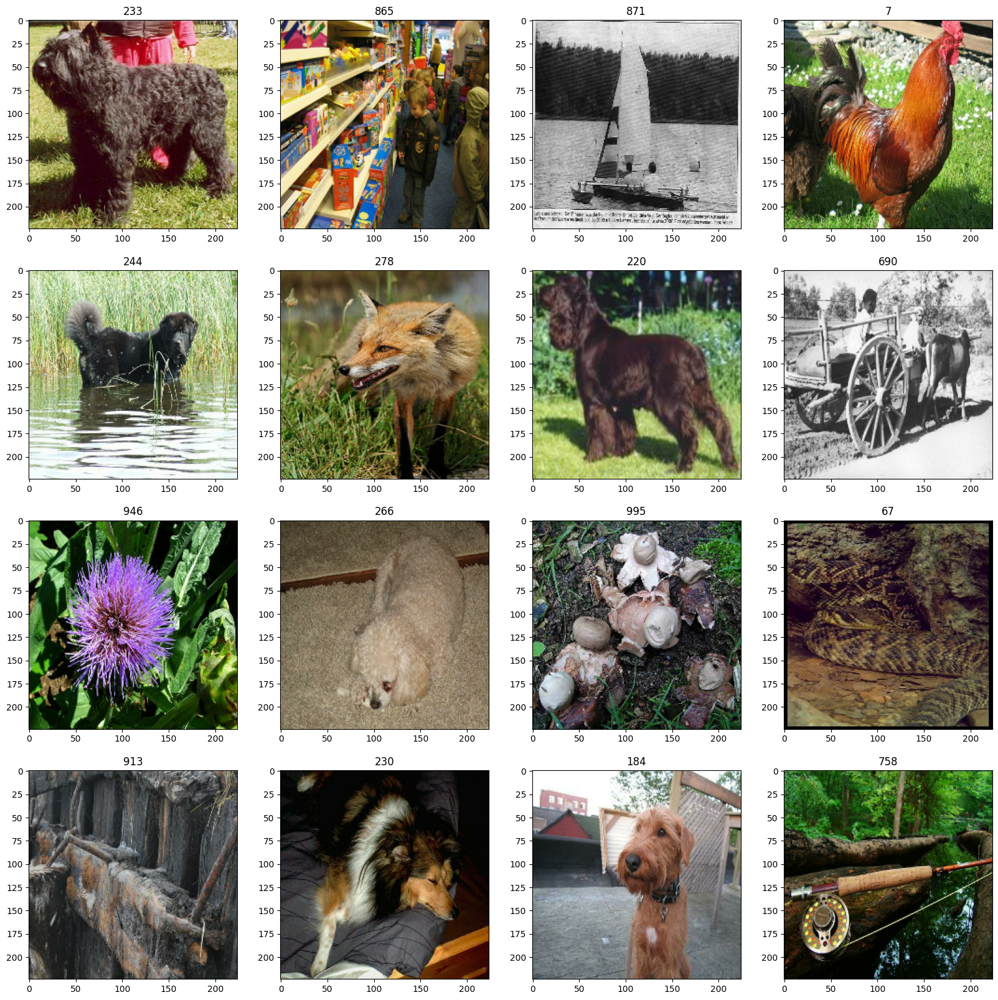

In [10]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(train_batch[0][:16]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(train_batch[1][idx])

### Preprocessing Data

In [11]:
data = data.map(lambda x, y: (x/255, y))
test = test.map(lambda x, y: (x/255, y))

In [12]:
scaled_iterator = data.as_numpy_iterator()
test_scaled_iterator = test.as_numpy_iterator()

In [13]:
batch = scaled_iterator.next()
test_batch = test_scaled_iterator.next()

In [14]:
batch[0].max()

1.0

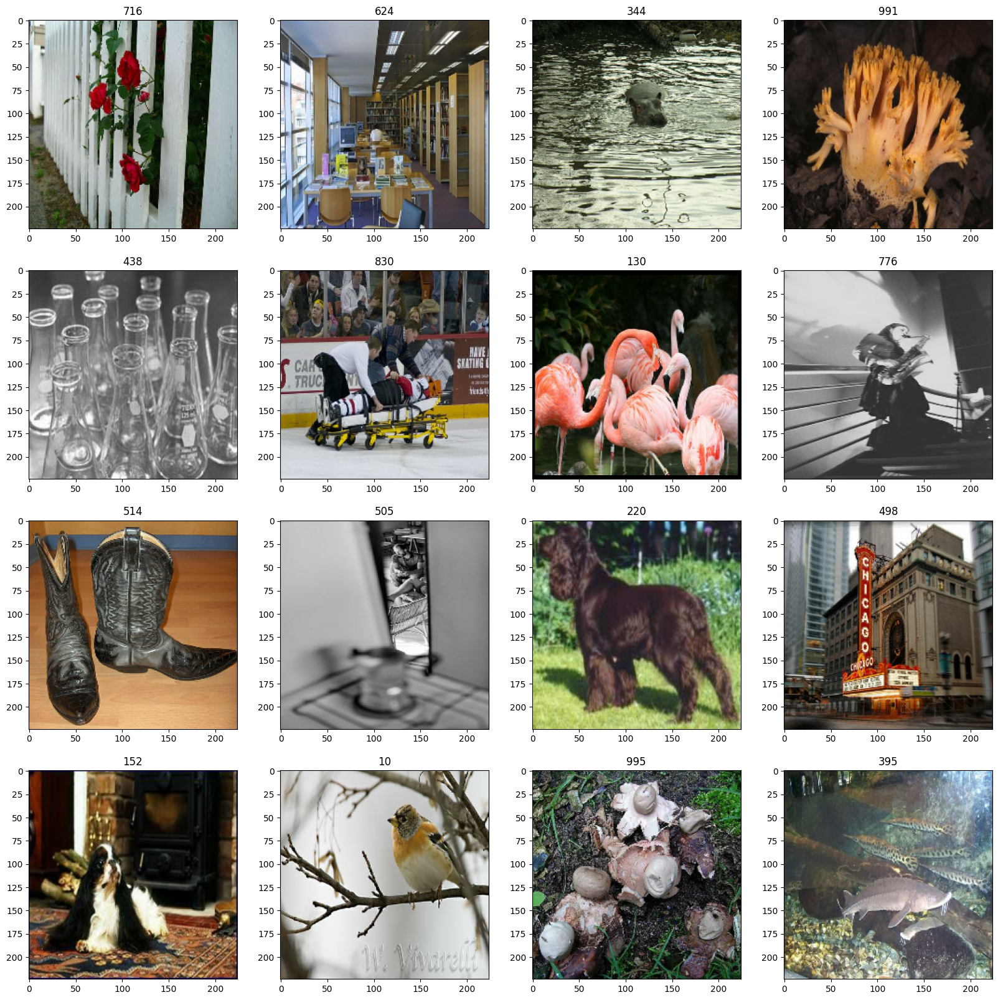

In [15]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(batch[0][:16]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

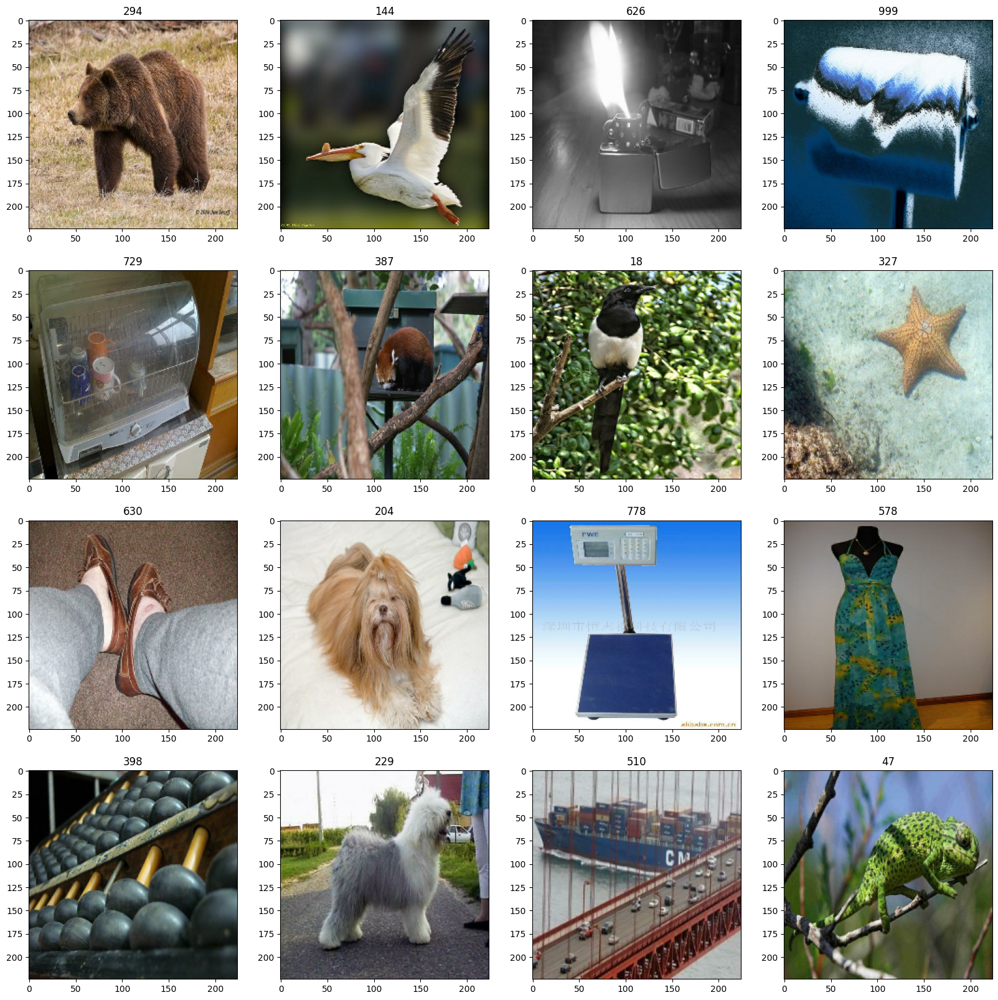

In [16]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(test_batch[0][:16]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(test_batch[1][idx])

In [16]:
train_size = int(len(data) * 0.8)
val_size = len(data) - train_size

In [17]:
train_size

15991

In [18]:
val_size

3998

In [19]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)

### Model

In [20]:
from tensorflow.keras.applications import MobileNetV2

In [21]:
base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model for feature extraction

# Add Custom Layers on top
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Reduce feature maps to vector
x = Dense(512, activation="relu")(x)
x = Dense(256, activation="relu")(x)
output_layer = Dense(1000, activation="softmax")(x)

In [22]:
model = Model(inputs=base_model.input, outputs=output_layer)
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [23]:
# Train Model
model.fit(train, validation_data=val, epochs=1)

15991/15991 [==============================] - 1299s 81ms/step - loss: 1.9668 - accuracy: 0.5505 - val_loss: 1.7262 - val_accuracy: 0.5980


In [ ]:

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0001, decay_steps=10000, decay_rate=0.9
)

# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.RMSprop(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train, validation_data=val, epochs=5)

In [63]:
model.evaluate(test)

1563/1563 [==============================] - 67s 42ms/step - loss: 2.2746 - sparse_categorical_accuracy: 0.5836


[2.2746381759643555, 0.5835800170898438]

In [64]:
model.predict(test)

array([[1.1729554e-04, 2.1507537e-06, 1.4491735e-06, ..., 1.6077308e-02,
        1.3024011e-04, 1.4502510e-07],
       [1.9791626e-04, 1.5368685e-06, 8.8518522e-05, ..., 2.8392701e-06,
        3.6289059e-06, 3.1635133e-04],
       [4.3469381e-08, 1.4407215e-07, 6.8744259e-07, ..., 5.5266014e-07,
        6.0233101e-06, 1.2824397e-09],
       ...,
       [3.9989282e-05, 1.9469046e-05, 3.6527810e-04, ..., 5.0231032e-05,
        2.3427347e-04, 1.0133603e-04],
       [5.8886584e-05, 3.6036231e-06, 3.2419854e-04, ..., 3.7000561e-04,
        1.5662476e-05, 3.0444122e-05],
       [1.7989896e-07, 1.8677121e-03, 3.6220084e-05, ..., 4.8963815e-05,
        3.3576764e-06, 1.0261691e-05]], dtype=float32)

In [65]:
model.predict(test).argmax(-1)

array([565, 426, 568, ..., 904,  24,  71], dtype=int64)

In [80]:
model.save("my_model", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model\assets
